<a href="https://colab.research.google.com/github/sambee5/data-science-coursework/blob/main/Unit8/Unit8Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Unit 8 Project: Writing a BARTical

**Task**:

Two parts:

1. Propose a data set that's compatible with a pymc_bart model. I must approve your submission before you move on to part 2.

2. Create, analyze, and present BART model, using pymc_bart within the colab environment, on a data set of your choice, with the following conditions:
  - your final model must have more than 2 predictors. The intercept term doesn't count as a predictor here (even though technically it is)
  - You must argue why your variable selection is justified. You may use either a theoretical or numerical argument. Additionally, you must comment on any potential interactions between your predictor variables.



Tips:

- Try to pick something that you care about, have knowledge of, experience with, or that you find interesting/cool.

- Gather data *before* picking a model or likelihood.

-  Use your best idea now; maybe you can look at the context you used in the previous project, and gather different data from it.

- Choose a data set with lots of columns, and lots of potential interactions between variables. It'll be more fun, and will make model/variable selection more relevant.

- Comment heavily, and explain your steps and thought process with text blocks. This is not only requried, it'll also help you understand what you're doing and what you want to do.

- Its ok to pick a data set for which you don't qute understand the context--so long as you think the context is cool.




https://www.kaggle.com/datasets/kanchana1990/nasa-exoplanet-archive-intelligence

In [1]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import seaborn as sns
import graphviz as gv

In [2]:
!pip install pymc-bart
import pymc_bart as pmb

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.9/179.9 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 17.0 MB/s eta 0:00:00


In [3]:
planet = pd.read_csv('https://raw.githubusercontent.com/sambee5/data-science-coursework/refs/heads/main/Unit8/nasa_exoplanet_intelligence.csv')
planet.head()

,planet_name,host_star,n_stars,n_planets,discovery_method,disc_year,disc_facility,orbital_period_days,planet_radius_earth,planet_mass_earth,...,ra,dec,controversial_flag,planet_type,habitable_zone_flag,multi_planet_system,is_recent_discovery,dist_category,star_type,orbital_period_cat
0,Kepler-1167 b,Kepler-1167,1,1,Transit,2016.0,Kepler,1.003934,1.710000,3.570,...,298.302660,47.693965,0,Super-Earth,False,False,False,Far(500-2kpc),K-type,Short(1-10d)
1,Kepler-1740 b,Kepler-1740,1,1,Transit,2021.0,Kepler,8.172400,3.323214,11.000,...,293.873663,38.922455,0,Mini-Neptune,False,False,True,Far(500-2kpc),G-type(Sun-like),Short(1-10d)
2,Kepler-1581 b,Kepler-1581,1,1,Transit,2016.0,Kepler,6.283855,0.800000,0.437,...,287.371320,39.603623,0,Sub-Earth,False,False,False,Mid(100-500pc),F-type,Short(1-10d)
3,Kepler-644 b,Kepler-644,1,1,Transit,2016.0,Kepler,3.173917,3.150000,10.100,...,295.475702,43.493112,0,Mini-Neptune,False,False,False,Far(500-2kpc),F-type,Short(1-10d)
4,Kepler-1752 b,Kepler-1752,1,1,Transit,2021.0,Kepler,56.358501,4.540605,18.700,...,290.854140,51.222743,0,Neptune-like,False,False,True,Far(500-2kpc),G-type(Sun-like),Medium(10-100d)


In [4]:
planet = planet.dropna()

make this more readable

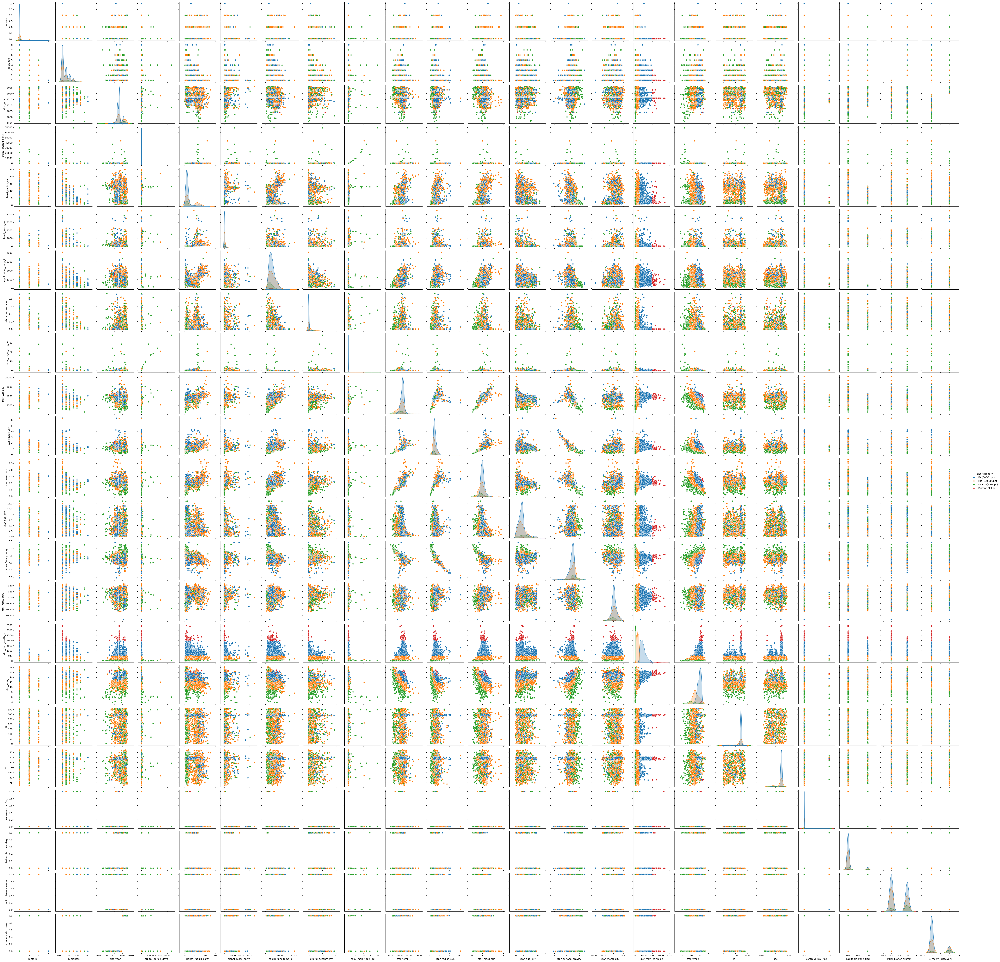

In [5]:
sns.pairplot(planet, hue='dist_category')

In [6]:
planet.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3806 entries, 0 to 6148
Data columns (total 31 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   planet_name           3806 non-null   object 
 1   host_star             3806 non-null   object 
 2   n_stars               3806 non-null   int64  
 3   n_planets             3806 non-null   int64  
 4   discovery_method      3806 non-null   object 
 5   disc_year             3806 non-null   float64
 6   disc_facility         3806 non-null   object 
 7   orbital_period_days   3806 non-null   float64
 8   planet_radius_earth   3806 non-null   float64
 9   planet_mass_earth     3806 non-null   float64
 10  equilibrium_temp_k    3806 non-null   float64
 11  orbital_eccentricity  3806 non-null   float64
 12  semi_major_axis_au    3806 non-null   float64
 13  star_temp_k           3806 non-null   float64
 14  star_radius_sun       3806 non-null   float64
 15  star_mass_sun         3806

I would like to predict whether a planet is habitable or not, in order to get an understanding of the factors that come into play when finding an Earth-like planet. The way the dataset characterizes whether a planet is habitable isn't that great (it just checks if equilibrium temp is between 200K-400K) so I will just predict planet equilibrium temperature as a proxy.

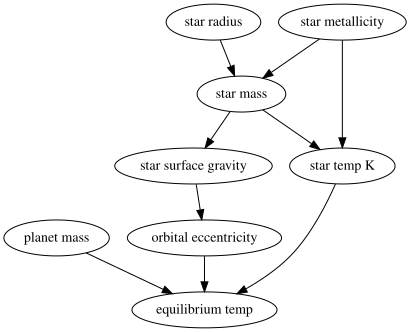

In [7]:
planetdag = gv.Digraph(name="PlanetDAG")

planetdag.node('A','star mass')
planetdag.node('B','star radius')
planetdag.node('C','star metallicity')
planetdag.node('D','star temp K')
planetdag.node('E','star surface gravity')
planetdag.node('F','orbital eccentricity')
planetdag.node('G','planet mass')
planetdag.node('H','equilibrium temp')

planetdag.edges(['BA','DH','EF','GH','CD','FH','AE','CA','AD'])

planetdag

Here is my causal diagram for predicting a planets temperature. Note that star metallicity means the makeup of the star. Examples include Iron etc. It would make sense that this influences temperature and mass (which I confirmed off google).

In [8]:
X = planet[['star_radius_sun','star_metallicity','star_mass_sun','star_temp_k','orbital_eccentricity','star_surface_gravity','planet_mass_earth']]

Y = planet['equilibrium_temp_k']

In [ ]:
with pm.Model() as model_planet:
    s = pm.HalfNormal('s',20) #sigma = 20 is a blind guess
    μ_ = pmb.BART("μ_", X, np.log(Y), m=50) #log around Y
    μ = pm.Deterministic("μ",pm.math.exp(μ_)) #exp it all once BART is done
    y = pm.Gamma("y", mu=μ, sigma=s,  observed=Y) #likelihood
    idata_counties = pm.sample(compute_convergence_checks=False)

In [ ]:
pm.sample_posterior_predictive(idata_counties,model_planet, extend_inferencedata=True)

<Axes: xlabel='y'>

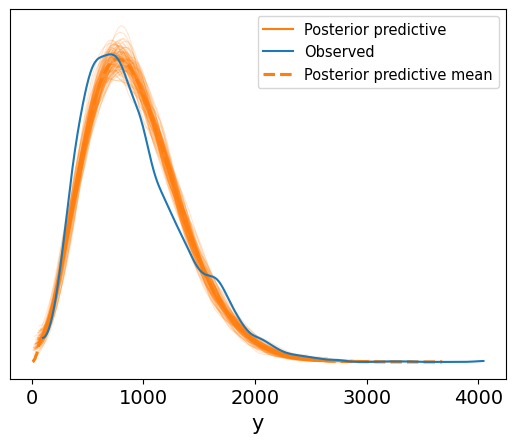

In [11]:
az.plot_ppc(idata_counties, num_pp_samples=100, colors=["C1", "C0", "C1"])

delete this graph because it sucks

In [12]:
posterior_mean = idata_counties.posterior["μ"]

μ_hdi = az.hdi(ary=idata_counties, group="posterior", var_names=["μ"], hdi_prob=0.74)

pps = az.extract(
    idata_counties, group="posterior_predictive", var_names=["y"]
).T

/usr/local/lib/python3.12/dist-packages/arviz/plots/hdiplot.py:166: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)


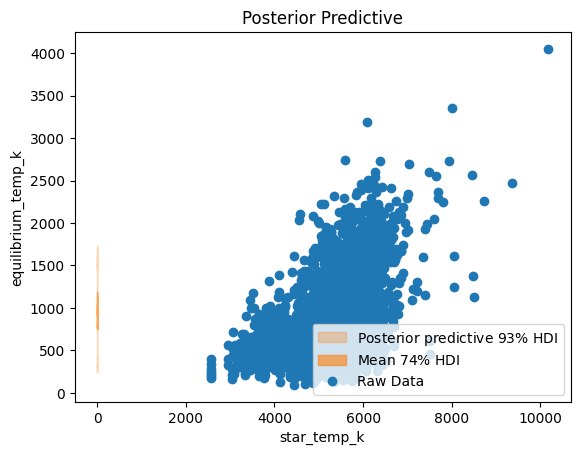

In [13]:
idx = np.argsort(X.to_numpy()[:, 4]) #grab fifth row
fig, ax = plt.subplots()

az.plot_hdi(
    x=X.to_numpy()[:, 4],#grab fifth row
    y=pps,
    ax=ax,
    hdi_prob=0.93,
    fill_kwargs={"alpha": 0.3, "label": r"Posterior predictive $93\%$ HDI"},
)

az.plot_hdi(
    x=X.to_numpy()[:, 4],#grab fifth row
    y=posterior_mean,
    ax=ax,
    hdi_prob=0.74,
    fill_kwargs={"alpha": 0.6, "label": r"Mean $74\%$ HDI"},
)
ax.plot(planet['star_temp_k'], planet["equilibrium_temp_k"], "o", c="C0", label="Raw Data")
ax.legend(loc="lower right")
ax.set(
    title="Posterior Predictive",
    xlabel="star_temp_k",
    ylabel="equilibrium_temp_k",
);

I believe that a BART model worked super well for this dataset. The predictors I chose had a great ability to predict the equilibrium temperature of a planet which makes me feel good about my hypothesis.

I'm now going to try making some other models with different variables tto test if some variables might have more importance than others.

/usr/local/lib/python3.12/dist-packages/pymc_bart/utils.py:494: UserWarning: The grid is smaller than the number of available variables to plot.
                Automatically adjusting the grid size.
  warnings.warn(


array([<Axes: xlabel='star_radius_sun'>,
       <Axes: xlabel='star_metallicity'>, <Axes: xlabel='star_mass_sun'>,
       <Axes: xlabel='star_temp_k'>,
       <Axes: xlabel='orbital_eccentricity'>,
       <Axes: xlabel='star_surface_gravity'>,
       <Axes: xlabel='planet_mass_earth'>], dtype=object)

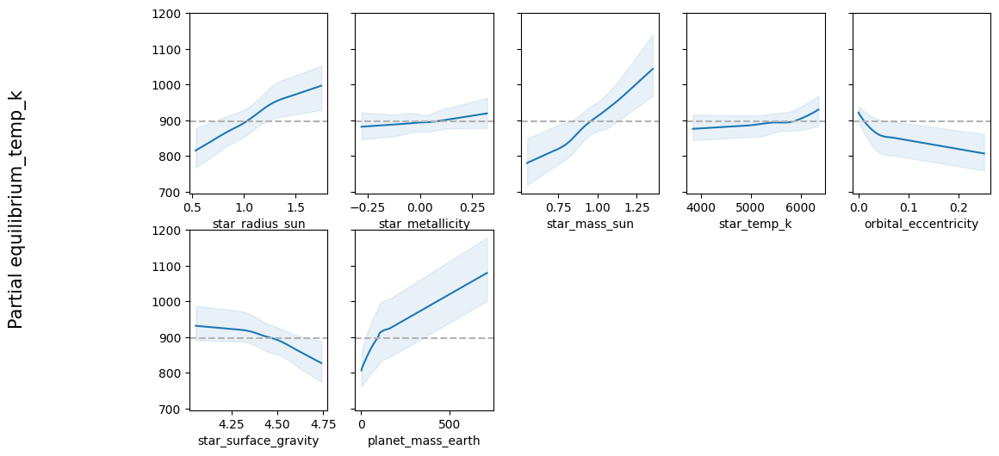

In [14]:
pmb.plot_pdp(μ_, X, Y, grid=(1, 5), func=np.exp, figsize = (12,6))

In this partial dependence plot, I notice that there are a number of variables that are all each pretty important. Specifically, I wanted to highlight the star_mass_sum variable. There seems to be a very strong (high slope) linear pattern between the a host star's mass and a planet's equilibrium temperature.

This is *really* interesting because I always thought that the stars temperature would have a more significant impact. If I think about it logically, then it makes sense because the more mass the star has, the stronger its gravitational pull, which have a direct influence on a planet's living conditions...

I'm not going to discount the contributions of the other variables which I've used here, they all seem like they have an imprtant contribution towards making the model as good as it is, but how much are they contributing???

/usr/local/lib/python3.12/dist-packages/pymc_bart/utils.py:494: UserWarning: The grid is smaller than the number of available variables to plot.
                Automatically adjusting the grid size.
  warnings.warn(


array([<Axes: xlabel='star_radius_sun'>,
       <Axes: xlabel='star_metallicity'>, <Axes: xlabel='star_mass_sun'>,
       <Axes: xlabel='star_temp_k'>,
       <Axes: xlabel='orbital_eccentricity'>,
       <Axes: xlabel='star_surface_gravity'>,
       <Axes: xlabel='planet_mass_earth'>], dtype=object)

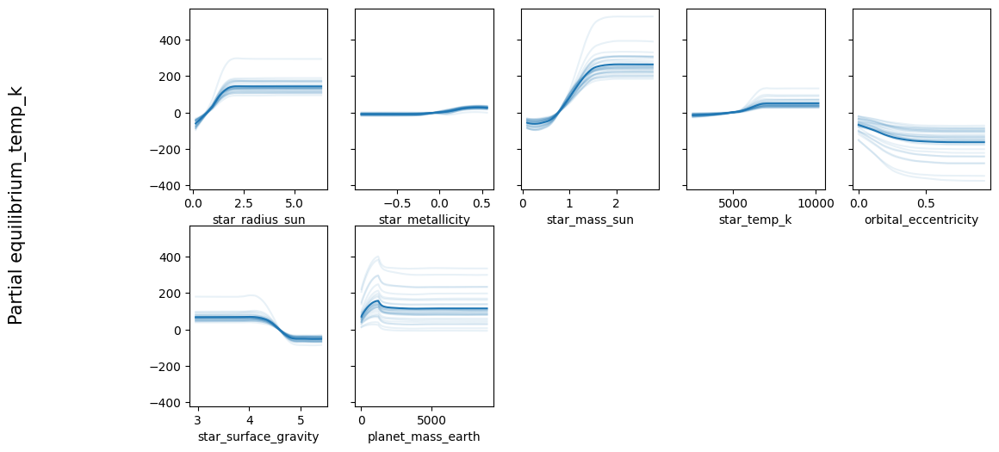

In [15]:
pmb.plot_ice( μ_, X, Y, grid=(1, 5), func=np.exp, figsize = (12,6))

The lines in the PDP are parallel which is a little confusing. I thought they should not be because some of these variables are dependent on other ones. For example, the stars surface gravity can be directly calculated by mass/(radius^2)

In [16]:
vi_counties = pmb.compute_variable_importance(idata_counties, μ_, X)

<Axes: ylabel='R²'>

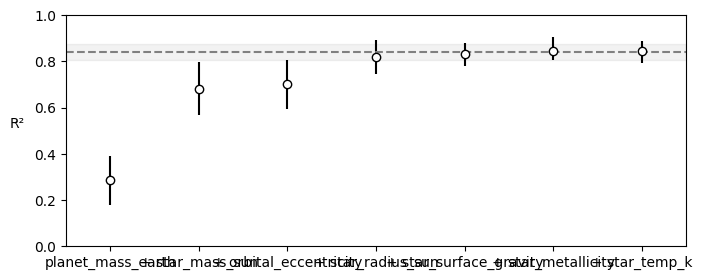

In [17]:
pmb.plot_variable_importance(vi_counties)

According to this variable importance plot, I see that my intuition was kind of wrong, and that planet_mass_earth played a more significant role as a predictor. However, I feel that having this variable is kind of cheating because it is a planet-specific property, and we're trying to predict ANOTHER planet-specific property. star_mass_sun isn't that far off though so I get partial credit for my guess

Planet metallicity ended up contributing the least as a predictor. This is kind of interesting to me because after research into what metallicity actually is, I thought it would have a much higher impact on a planet's temperature, since the fuel that a star burns depends on it's metallicity, which play important roles in other characteristics of a star.